https://segment-anything.com/

In [1]:
# # Export the CUDA_VISIBLE_DEVICES environment variable
# import os

# output = !python3 /workspace/search_gpu.py --target 10

# os.environ["CUDA_VISIBLE_DEVICES"] = output[0]

# # Display the value of cuda_device
# print("CUDA device:", os.environ["CUDA_VISIBLE_DEVICES"] )


import os
# Set the environment variable for CUDA
os.environ["CUDA_VISIBLE_DEVICES"] = "MIG-c65e10b9-6854-5af7-b015-f5f0c73639d1"
os.chdir("/workspace/code/Github/DL-FOR-COMPUTER-VISION/test/yolo11")
print("Current directory:", os.getcwd())

Current directory: /workspace/code/Github/DL-FOR-COMPUTER-VISION/test/yolo11


In [9]:
import IPython
import sys

def clean_notebook():
    IPython.display.clear_output(wait=True)
    print("Notebook cleaned.")

# Run the installation commands
!pip install opendatasets
!pip install ultralytics

# Clean up the notebook
clean_notebook()



Notebook cleaned.


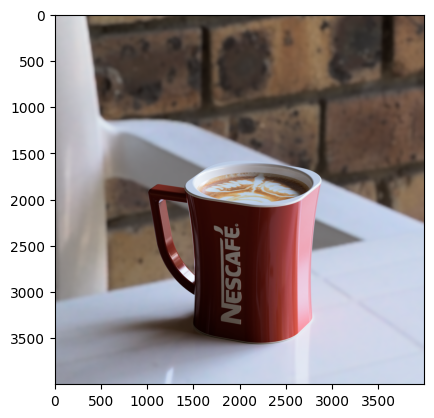

In [ ]:
from PIL import Image
import matplotlib.pyplot as plt

image_file = "./yolo-datasets/YOLO Datasets/coffee.png"
#display the image


img = Image.open(image_file)
plt.imshow(img)

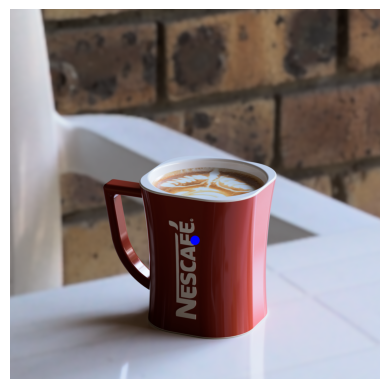

In [22]:
from PIL import Image, ImageDraw
import matplotlib.pyplot as plt

# Path to the image file
image_file = "./yolo-datasets/YOLO Datasets/coffee.png"

# Open the image
img = Image.open(image_file)

# Create a drawing object
draw = ImageDraw.Draw(img)

# Define the point coordinates and the color
point = (2000, 2500)
color = (0, 0, 255)  # Blue in RGB

# Draw the point (circle) at the specified location
radius = 50  # Adjust the size of the point
draw.ellipse([point[0] - radius, point[1] - radius, point[0] + radius, point[1] + radius], fill=color)

# Display the modified image
plt.imshow(img)
plt.axis("off")
plt.show()



image 1/1 /workspace/code/Github/DL-FOR-COMPUTER-VISION/test/yolo11/yolo-datasets/YOLO Datasets/coffee.png: 1024x1024 1 0, 652.5ms
Speed: 6.6ms preprocess, 652.5ms inference, 3.2ms postprocess per image at shape (1, 3, 1024, 1024)


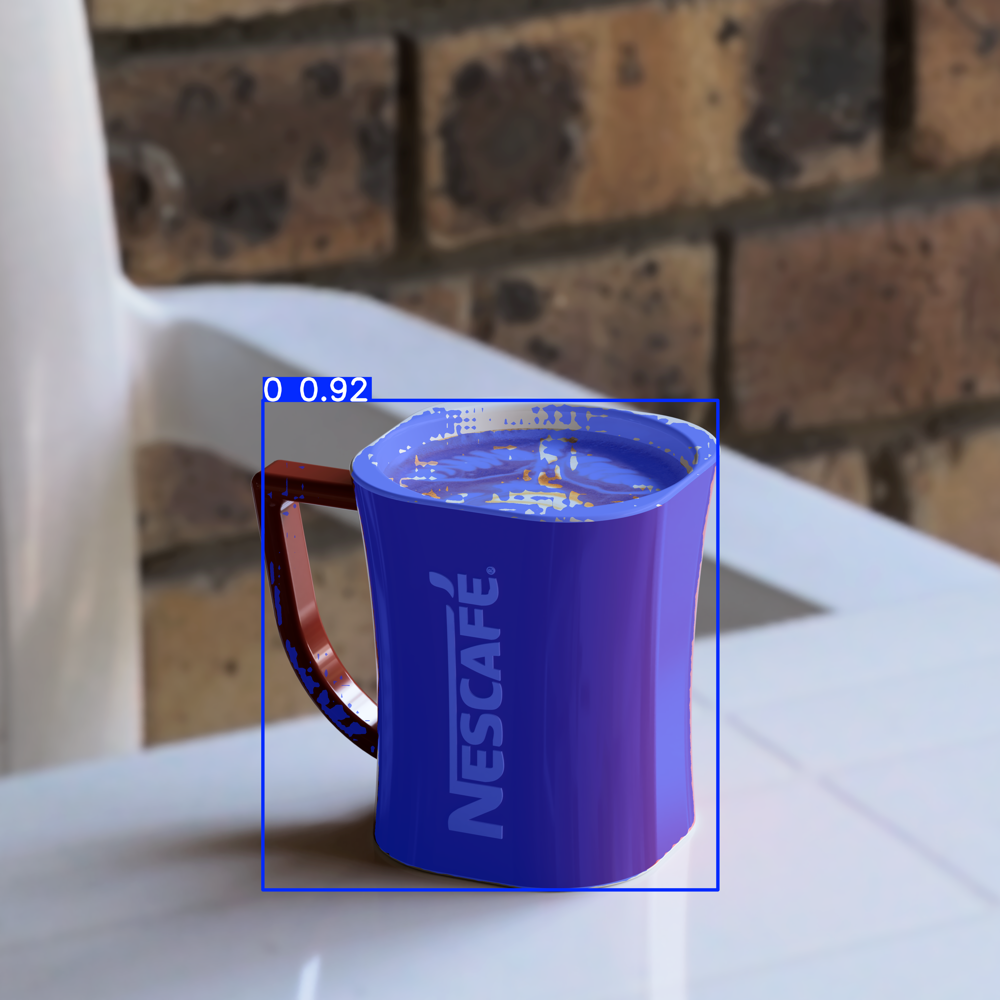

In [21]:
from ultralytics import SAM

model = SAM('sam_b.pt')

# Run inference with single point
results = model("./yolo-datasets/YOLO Datasets/coffee.png",points=[2000,2500])
results[0].show()

In [6]:
from ultralytics.vit import SAM
model = SAM('sam_b.pt')
results = model.predict('video/kids.mp4', device = 0)

Ultralytics YOLOv8.0.106 🚀 Python-3.10.12 torch-2.4.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)


    WARNING ⚠️ stream/video/webcam/dir predict source will accumulate results in RAM unless `stream=True` is passed,
    causing potential out-of-memory errors for large sources or long-running streams/videos.

    Usage:
        results = model(source=..., stream=True)  # generator of Results objects
        for r in results:
            boxes = r.boxes  # Boxes object for bbox outputs
            masks = r.masks  # Masks object for segment masks outputs
            probs = r.probs  # Class probabilities for classification outputs

video 1/1 (1/354) /content/video/kids.mp4: 1280x3 1214.5ms
video 1/1 (2/354) /content/video/kids.mp4: 1280x3 1154.7ms
video 1/1 (3/354) /content/video/kids.mp4: 1280x3 1160.7ms
video 1/1 (4/354) /content/video/kids.mp4: 1280x3 1180.8ms
video 1/1 (5/354) /content/video/kids.mp4: 1280x3 1161.3ms
video 1/1 (6/354) /content/video/kids.mp4: 1280x3 1193.5ms
vide

KeyboardInterrupt: 

In [ ]:
# webcam
from ultralytics.vit import SAM
model = SAM("sam_l.pt")
results = model.predict(0, device = 0, show = True)

# Generate Segmentation Dataset Using a Detection Model

https://github.com/ultralytics/ultralytics

In [7]:
from ultralytics.yolo.data.annotator import auto_annotate

auto_annotate(data="images", det_model="yolov8x.pt", sam_model='sam_b.pt')


Ultralytics YOLOv8.0.106 🚀 Python-3.10.12 torch-2.4.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
100%|██████████| 131M/131M [00:00<00:00, 220MB/s]
/usr/local/lib/python3.10/dist-packages/ultralytics/nn/tasks.py:381: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded

# Code for auto annotation

In [ ]:
import cv2
import numpy as np
from pathlib import Path

from ultralytics import YOLO
from ultralytics.vit.sam import PromptPredictor, build_sam
from ultralytics.yolo.utils.torch_utils import select_device

import matplotlib.pyplot as plt

def auto_annotate(data, det_model='yolov8x.pt', sam_model='sam_b.pt', device='', output_dir=None):
    """
    Automatically annotates images using a YOLO object detection model and a SAM segmentation model.
    Args:
        data (str): Path to a folder containing images to be annotated.
        det_model (str, optional): Pre-trained YOLO detection model. Defaults to 'yolov8x.pt'.
        sam_model (str, optional): Pre-trained SAM segmentation model. Defaults to 'sam_b.pt'.
        device (str, optional): Device to run the models on. Defaults to an empty string (CPU or GPU, if available).
        output_dir (str, None, optional): Directory to save the annotated results.
            Defaults to a 'labels' folder in the same directory as 'data'.
    """
    device = select_device(device)
    det_model = YOLO(det_model)
    sam_model = build_sam(sam_model)
    det_model.to(device)
    sam_model.to(device)

    if not output_dir:
        output_dir = Path(str(data)).parent / 'labels'
    Path(output_dir).mkdir(exist_ok=True, parents=True)

    prompt_predictor = PromptPredictor(sam_model)
    det_results = det_model(data, stream=True)

    for result in det_results:
        boxes = result.boxes.xyxy  # Boxes object for bbox outputs
        class_ids = result.boxes.cls.int().tolist()  # noqa
        if len(class_ids):
            prompt_predictor.set_image(result.orig_img)
            masks, _, _ = prompt_predictor.predict_torch(
                point_coords=None,
                point_labels=None,
                boxes=prompt_predictor.transform.apply_boxes_torch(boxes, result.orig_shape[:2]),
                multimask_output=False,
            )



            result.update(masks=masks.squeeze(1))
            segments = result.masks.xyn  # noqa



            with open(str(Path(output_dir) / Path(result.path).stem) + '.txt', 'w') as f:
                for i in range(len(segments)):
                    s = segments[i]
                    if len(s) == 0:
                        continue
                    segment = map(str, segments[i].reshape(-1).tolist())
                    f.write(f'{class_ids[i]} ' + ' '.join(segment) + '\n')
